# Real Time pose correction with Open Pose

## Authors:
Nichitov Tudor & Alexander Kinzer

##Insitution
TU Wien

##Course
Assistance Systems in Manufacturing 2

## Short description
This program presensts the project work done during the 4 days of Hackathon from the TU Wien Pilotfabrik. It does real time image capture from the webcam and pose recognition and correction in accordance to ergonomic standards each ~2 seconds.

The code chunks must be executed in order. Most of the blocks contain prerequisites for the program, while the last code chunk contains the 'main' of the application and showcases all functionalities.

## Functions used to capture video input and convert it into an openCV image:


### Helper function

In [ ]:

def js_to_image(js_reply):
  """
  This is a function used to convert the JavaScript object into an OpenCV image. It is used on each frame we do pose detection on.
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img



### The video stream function based on a Javascript API


In [ ]:

def video_stream():
  """
  This is a function used to properly create our live video stream using our webcam as input

  The function doesn't return anything. We just call it and it displays the video stream
  """
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

## The following 2 functions achieve the following:
### 1) Loading the model and initializing the body parts
### 2) Processing the frames and using the information from the model to do pose detection and correction on each frame, generating messages, audio and visual cues when an incorrect pose is detected (based on ergonomic standards)

In [ ]:
def Initialize_Model():
  """
  This function loads the model is called only once, at the start of our application.

  Returns:
         net: deep learning model used to identify body parts on a image of a single individual
  """

  BODY_PARTS = { "Nose": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4,
                   "LShoulder": 5, "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
                   "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "REye": 14,
                   "LEye": 15, "REar": 16, "LEar": 17, "Background": 18 }

  POSE_PAIRS = [ ["Neck", "RShoulder"], ["Neck", "LShoulder"], ["RShoulder", "RElbow"],
                   ["RElbow", "RWrist"], ["LShoulder", "LElbow"], ["LElbow", "LWrist"],
                   ["Neck", "RHip"], ["RHip", "RKnee"], ["RKnee", "RAnkle"], ["Neck", "LHip"],
                   ["LHip", "LKnee"], ["LKnee", "LAnkle"], ["Neck", "Nose"], ["Nose", "REye"],
                   ["REye", "REar"], ["Nose", "LEye"], ["LEye", "LEar"] ]


  OPENPOSE_URL="http://posefs1.perception.cs.cmu.edu/OpenPose/models/"
  POSE_FOLDER="/content/openpose/"

  !wget http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/coco/pose_iter_440000.caffemodel
  !wget https://raw.githubusercontent.com/opencv/opencv_extra/4.x/testdata/dnn/openpose_pose_coco.prototxt


  net = cv2.dnn.readNetFromCaffe('/content/openpose_pose_coco.prototxt','/content/pose_iter_440000.caffemodel')

  #  inp = cv2.dnn.blobFromImage('/content/photo.jpg')

  return net

def Pose_Estimation(img,net):
  """
  This function is used in a loop, while the camera is active. It is used to do pose detection and correction on a frame,
  using the information from a pre-trained model.

  Params:
        img: OpenCV image, which represents a frame
        net: Pre-trained model

  Output: The frame with the identified body parts overwritten. In case of an incorrect posture, a sound is played
  (possible to be played multiple times), warning messages are outputted and the 'line' of the body part in an
  incorrect stance is drawn with red instead of blue
  """

  from IPython.display import Audio
  BODY_PARTS = { "Nose": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4,
                   "LShoulder": 5, "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
                   "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "REye": 14,
                   "LEye": 15, "REar": 16, "LEar": 17, "Background": 18 }

  POSE_PAIRS = [ ["Neck", "RShoulder"], ["Neck", "LShoulder"], ["RShoulder", "RElbow"],
                   ["RElbow", "RWrist"], ["LShoulder", "LElbow"], ["LElbow", "LWrist"],
                   ["Neck", "RHip"], ["RHip", "RKnee"], ["RKnee", "RAnkle"], ["Neck", "LHip"],
                   ["LHip", "LKnee"], ["LKnee", "LAnkle"], ["Neck", "Nose"], ["Nose", "REye"],
                   ["REye", "REar"], ["Nose", "LEye"], ["LEye", "LEar"] ]
  import cv2


  # CUT THE FUNCTION FROM HERE AND USE THIS INTO A LOOP
  inwidth = int(img.shape[1]/4)
  inheight = int(img.shape[0]/4)

  input = cv2.dnn.blobFromImage(img, 1.0 / 255, (inwidth,inheight),  (0, 0, 0), swapRB=False, crop=False)
  net.setInput(input)
  #Getting the model output
  out = net.forward()

  frameWidth = img.shape[1]
  frameHeight = img.shape[0]
  points = []
  #Manually set treshold for identifying body parts
  tresh = 0.5

  for i in range(len(BODY_PARTS)):
    # Slice heatmap of corresponging body's part.
    heatMap = out[0, i, :, :]


    _, conf, _, point = cv2.minMaxLoc(heatMap)
    x = (frameWidth * point[0]) / out.shape[3]
    y = (frameHeight * point[1]) / out.shape[2]

    type(point)
    # Add a point if its confidence is higher than threshold.
    points.append((int(x), int(y)) if conf > tresh else None)


  from google.colab.patches import cv2_imshow
  i = 0
  parts = ["Nose", "Neck", "RShoulder", "RElbow", "RWrist",
                   "LShoulder", "LElbow", "LWrist", "RHip", "RKnee",
                   "RAnkle", "LHip", "LKnee", "LAnkle", "REye",
                   "LEye", "REar", "LEar", "Background"]



  # Loading the sound file which will play if an incorrect pose is found
  sound_file = '/content/audio.wav'
  wn = Audio(sound_file, autoplay=True) ##

   #The next part contains if statements regarding the pose correction:
  # All statements also have the condition of working only if the parts are identified.
  # comparing positions of elbows with shoulders and arms with the head.
  # also we have different conditions for back bending.


  # The k variables are used later when drawing the lines between the body parts and we use them to decide which lines are red
  # (depicting a body part in a non-ergonomic posture)
  k1=0
  k2=0
  k3=0
  k4=0
  k5=0
  k6=0
  k7=0

  #The following statements are used to compare positions of body parts and check the different ergonomic conditions
  if not ( (isinstance(points[4], type(None))) or  (isinstance(points[0], type(None))) ):
    if(points[4][1] < points[0][1]):
      k1=1;
      print("R wrist above head level - incorrect posture")
      display(wn)##

  if not ( (isinstance(points[7], type(None))) or (isinstance(points[0], type(None))) ):
    if(points[7][1] < points[0][1]):
      k2=1;
      print("L wrist above head level - incorrect posture")
      display(wn)##

  if not( (isinstance(points[3], type(None))) or (isinstance(points[2], type(None))) ):
    if(points[3][1] < points[2][1]):
      k3=1;
      print("R elbow above R shoulder - incorrect posture")
      display(wn)##

  if not ( (isinstance(points[6], type(None))) or (isinstance(points[5], type(None))) ):
    if(points[6][1] < points[5][1]):
      k4=1;
      print("L elbow above L shoulder - incorrect posture")
      display(wn)##

  if not ( (isinstance(points[1], type(None))) or (isinstance(points[11], type(None))) or (isinstance(points[8], type(None)))):
    stmt =  abs( points[1][0] - ( ( points[11][0] + points[8][0] ) /2 ) ) / abs( points[1][1] - ( ( points[11][1] + points[8][1] )/2 ) )

    if(  stmt > 0.36 ):
      k5=1;
      print("Back bent - incorrect posture")
      display(wn)##
  # right hip AND RIGHT SHOULDER detected AND NECK NOT DETECTED AND LEFT HIP NOT detected
  if( (not((isinstance(points[8], type(None))) or (isinstance(points[2], type(None))))) and (isinstance(points[1], type(None))
  and (isinstance(points[11], type(None)))) ):
    if(abs( points[2][1] - (  points[8][1] ) !=  0)):
      stmt =  abs( points[2][0] - (  points[8][0] ) ) / abs( points[2][1] - (  points[8][1] ) )
      if(  stmt > 0.36 ):
        k6=1;
        print("Back bent - incorrect posture")
        display(wn)##

  # left hip AND left SHOULDER detected and -//-
  if( (not((isinstance(points[5], type(None))) or (isinstance(points[11], type(None))))) and (isinstance(points[1], type(None))
  and (isinstance(points[8], type(None)))) ):
    if(abs( points[5][1] - (  points[11][1] )!= 0)):
     stmt =  abs( points[5][0] - (  points[11][0] ) ) / abs( points[5][1] - (  points[11][1] ) )
     if(  stmt > 0.36 ):
      k7=1;
      print("Back bent - incorrect posture")
      display(wn)##

#Displaying the identified points on the image and the lines between the points
#The non ergonomic lines of body parts are drawn with red instead of blue

  for pair in POSE_PAIRS:
    partFrom = pair[0]
    partTo = pair[1]

    assert(partFrom in BODY_PARTS)
    assert(partTo in BODY_PARTS)

    idFrom = BODY_PARTS[partFrom]
    idTo = BODY_PARTS[partTo]


    if points[idFrom] and points[idTo]:
      if(k2==1 and idFrom == 6 and idTo==7 ):  #left wrist above nose
         cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
         k2=0

      elif(k4==1 and idFrom == 5 and idTo==6 ):  #left elbow above left shoulder
         cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
         k4=0

      elif(k1==1 and idFrom == 3 and idTo==4 ): #right wrist above nose
        cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
        k1=0

      elif(k3==1 and idFrom == 2 and idTo==3 ): #right elbow above right shoulder
        cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
        k3=0

      elif((k5==1 or k6==1 or k7==1)  and (idFrom ==1  and idTo==8 )): #back bent + identify neck
        cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
        k5=0
        k6=0
        k7=0

      elif((k5==1 or k6==1 or k7==1) and idFrom ==1  and idTo==11 ): #back bent + identify neck
        cv2.line(img, points[idFrom], points[idTo], (0, 0, 255), 3)
        k5=0
        k6=0
        k7=0

      else:
       cv2.line(img, points[idFrom], points[idTo], (255, 74, 0), 3)
       cv2.ellipse(img, points[idFrom], (4, 4), 0, 0, 360, (255, 255, 255), cv2.FILLED)
       cv2.ellipse(img, points[idTo], (4, 4), 0, 0, 360, (255, 255, 255), cv2.FILLED)
       cv2.putText(img, str(idFrom), points[idFrom], cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 255),2,cv2.LINE_AA)
       cv2.putText(img, str(idTo), points[idTo], cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 255),2,cv2.LINE_AA)



  cv2_imshow(img)






### Uploading any soundfile to be played when the pose is incorrect.
(rename it to audio.wav)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving audio.wav to audio.wav


# Main - importing all necessary prerequisites and starting the real-time pose estimation and correction

<IPython.core.display.Javascript object>

--2022-10-15 19:43:31--  http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/coco/pose_iter_440000.caffemodel
Resolving posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)... 128.2.220.57
Connecting to posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)|128.2.220.57|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 209274056 (200M) [text/plain]
Saving to: ‘pose_iter_440000.caffemodel’

pose_iter_440000.ca 100%[===================>] 199.58M  24.6MB/s    in 12s     

2022-10-15 19:43:43 (16.5 MB/s) - ‘pose_iter_440000.caffemodel’ saved [209274056/209274056]

--2022-10-15 19:43:43--  https://raw.githubusercontent.com/opencv/opencv_extra/4.x/testdata/dnn/openpose_pose_coco.prototxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response...

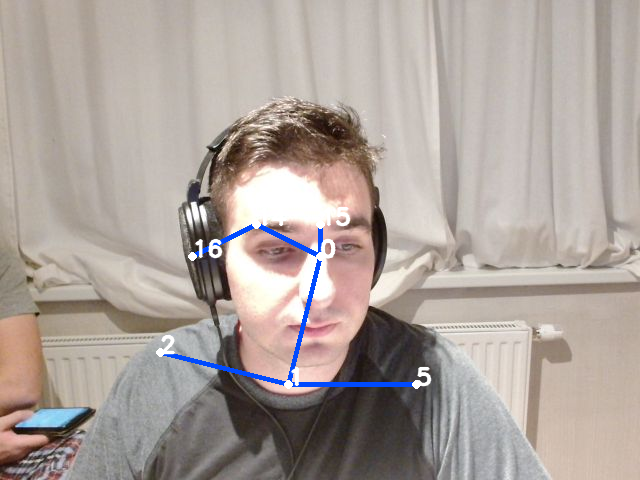

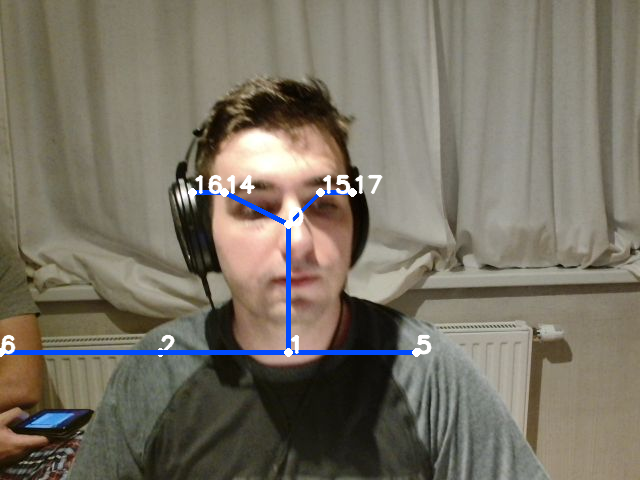

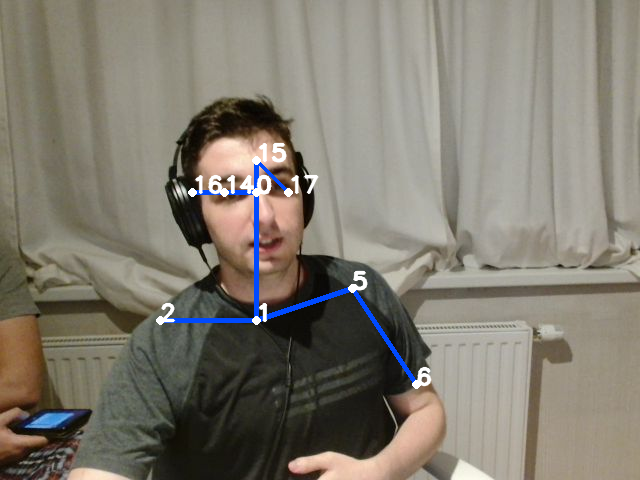

L wrist above head level - incorrect posture


R elbow above R shoulder - incorrect posture


L elbow above L shoulder - incorrect posture


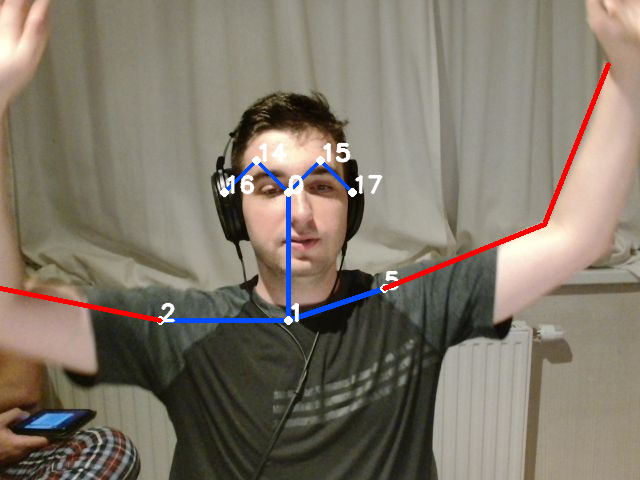

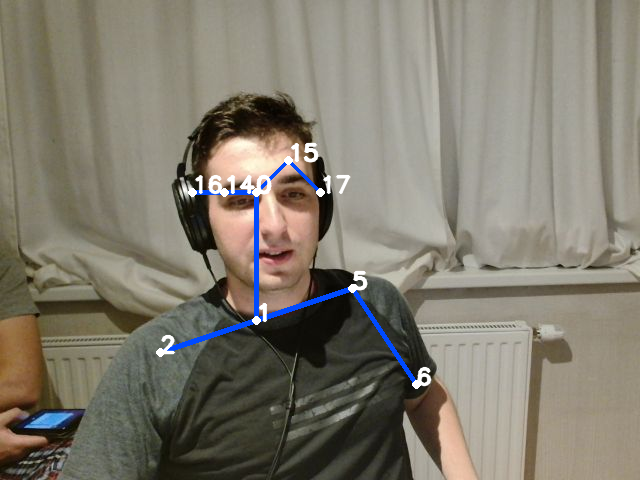

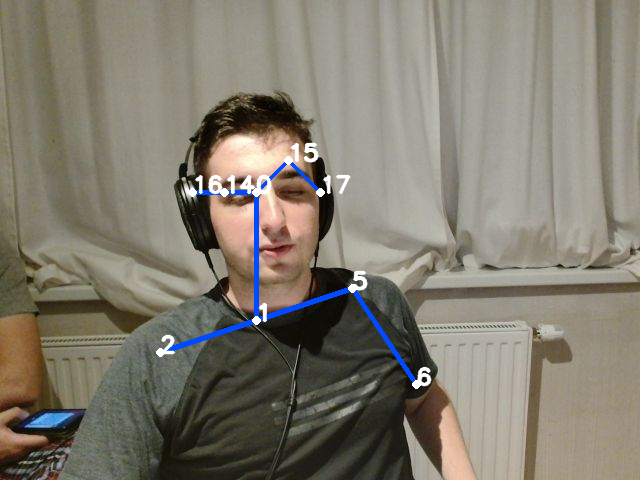

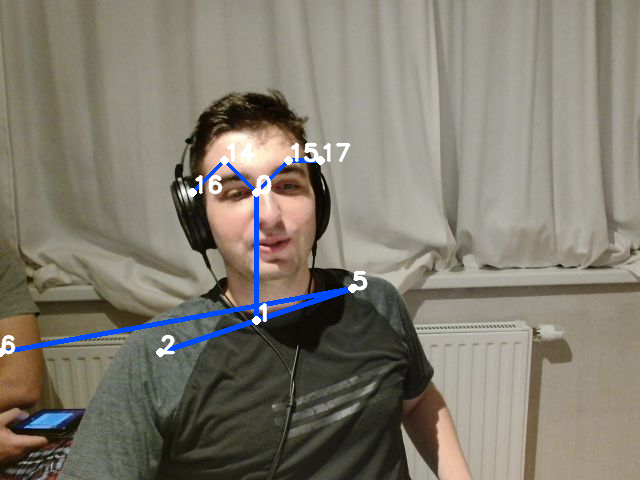

R wrist above head level - incorrect posture


L wrist above head level - incorrect posture


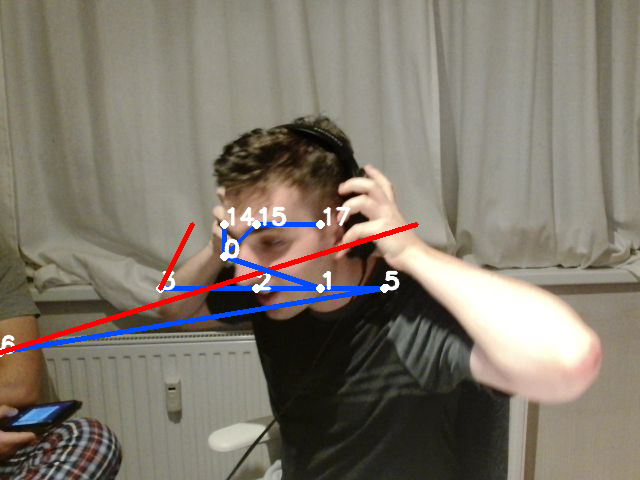

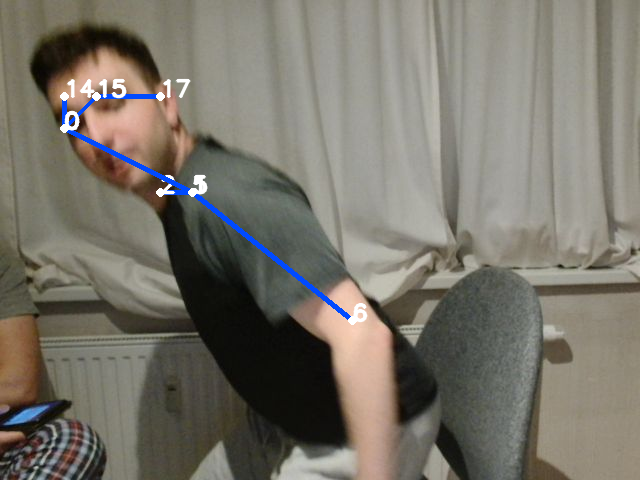

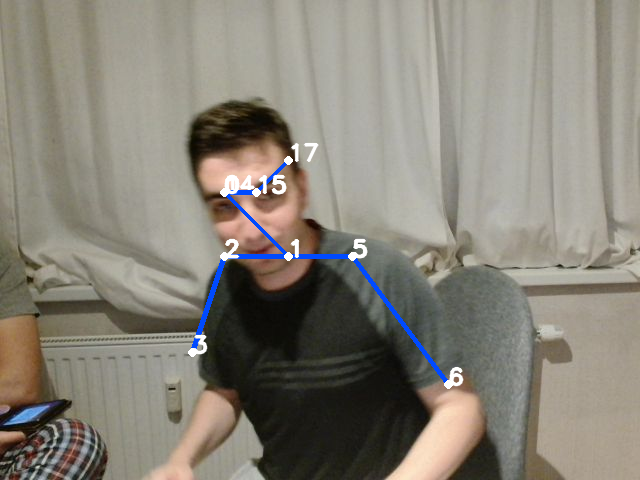

R wrist above head level - incorrect posture


R elbow above R shoulder - incorrect posture


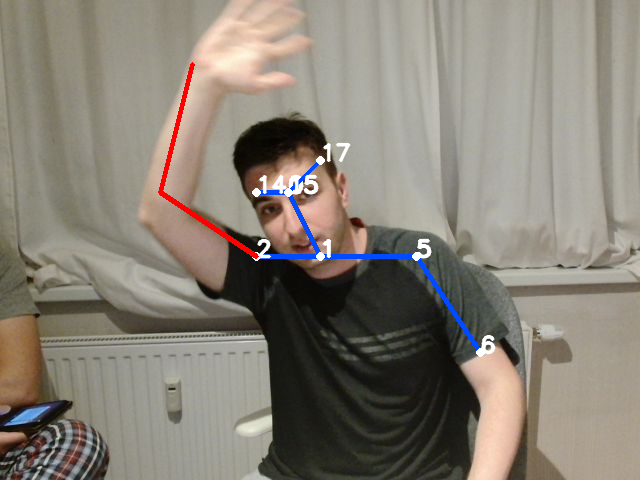

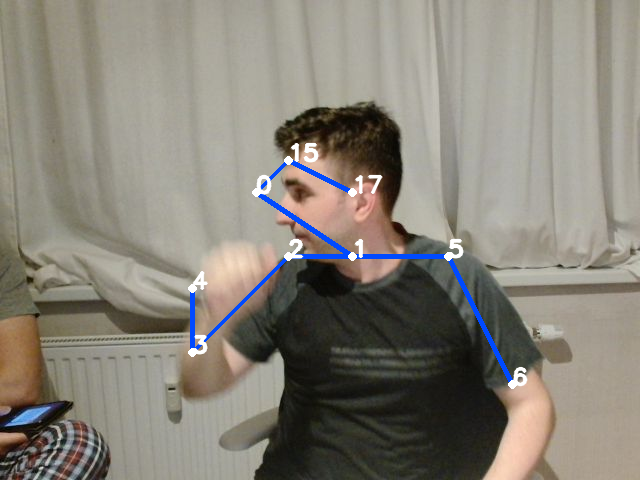

L wrist above head level - incorrect posture


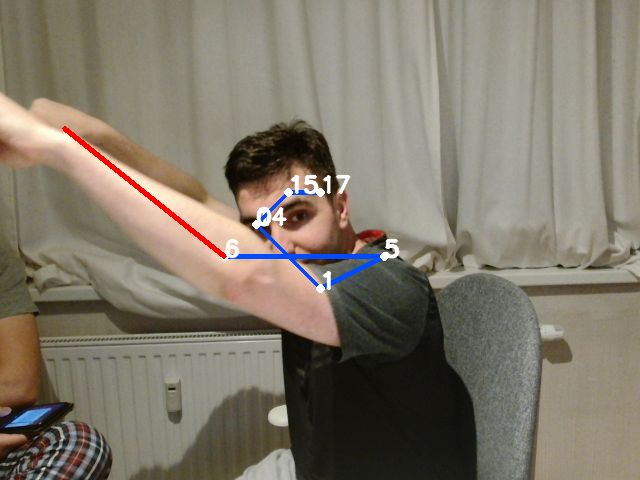

R wrist above head level - incorrect posture


L wrist above head level - incorrect posture


R elbow above R shoulder - incorrect posture


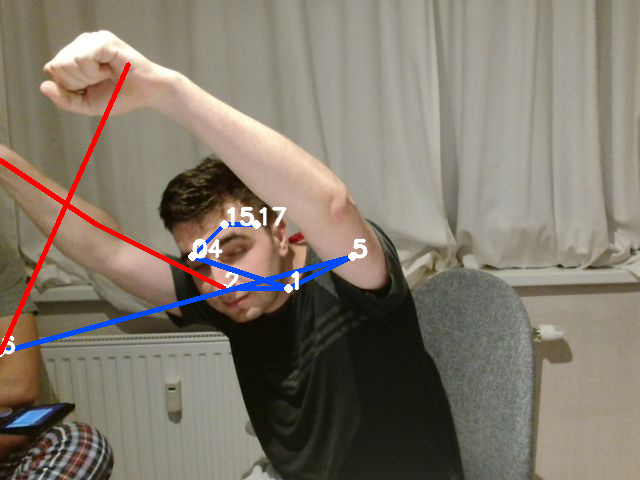

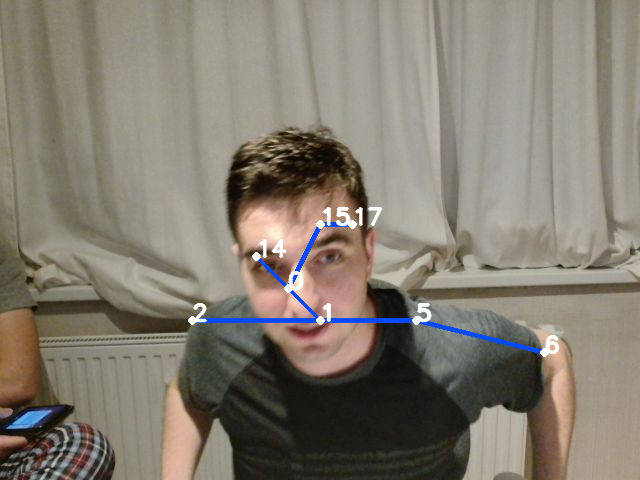

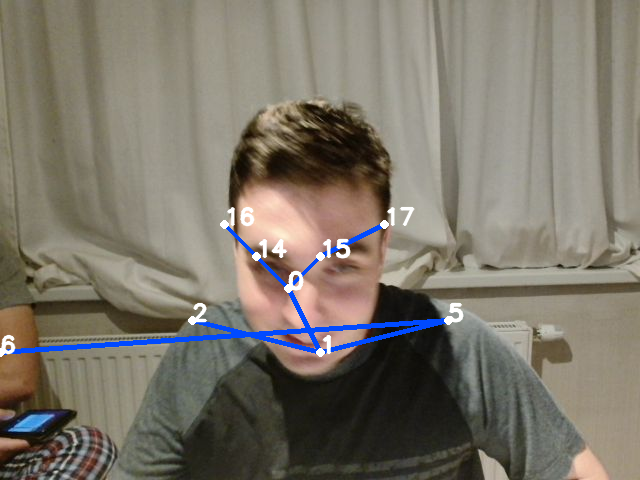

In [ ]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
from google.colab.patches import cv2_imshow


# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
net = Initialize_Model()


while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Imageas
    img = js_to_image(js_reply["img"])

    Pose_Estimation(img,net)


#FROM HERE WE ADD THE POSE DETECTION AND OVERWRITE THE PHOTOS